# Dependências

In [88]:
#!pip -q install catboost
#!pip -q install shap

In [89]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

# Métricas
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay

# Seleção
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

# Modelos
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# Importando CSV
#from google.colab import drive

# Tratar dados
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import re
from imblearn.under_sampling import RandomUnderSampler

# SHAP
import shap
import statistics

# Lendo CSV

In [90]:
# Montando drive
#drive.mount('/content/drive')
#filename = '/content/drive/MyDrive/BSI/2023-2/PD2/Datasets/covid_es_dados.es.gov.br.csv'

# Local
filename = "./data/covid_es_dados.es.gov.br.csv"
covid_df = pd.read_csv(filename, sep=";", index_col=False, encoding="iso-8859-1")

Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.


In [91]:
covid_df.shape

(4897896, 45)

In [92]:
covid_df.head()

,DataNotificacao,DataCadastro,DataDiagnostico,DataColeta_RT_PCR,DataColetaTesteRapido,DataColetaSorologia,DataColetaSorologiaIGG,DataEncerramento,DataObito,Classificacao,...,ViagemBrasil,ViagemInternacional,ProfissionalSaude,PossuiDeficiencia,MoradorDeRua,ResultadoRT_PCR,ResultadoTesteRapido,ResultadoSorologia,ResultadoSorologia_IGG,TipoTesteRapido
0,2023-09-19,2023-09-19,2023-09-14,NaN,NaN,NaN,NaN,NaN,NaN,Suspeito,...,Não,Não,Não,Não,Não,Não Informado,Não Informado,Não Informado,Não Informado,Não Informado
1,2023-09-19,2023-09-19,2023-09-18,NaN,2023-09-19,NaN,NaN,NaN,NaN,Síndrome Gripal não Especificada,...,Não,Não,Não,Não,Não,Não Informado,Negativo,Não Informado,Não Informado,Teste rápido Antígeno
2,2023-09-19,2023-09-19,2023-09-17,NaN,2023-09-19,NaN,NaN,NaN,NaN,Suspeito,...,Não,Não,Não,Não,Não,Não Informado,Negativo,Não Informado,Não Informado,Teste rápido Antígeno
3,2023-09-19,2023-09-19,2023-09-16,NaN,NaN,NaN,NaN,NaN,NaN,Suspeito,...,Não,Não,Não,Não,Não,Não Informado,Não Informado,Não Informado,Não Informado,Não Informado
4,2023-09-19,2023-09-19,2023-09-17,NaN,2023-09-19,NaN,NaN,NaN,NaN,Suspeito,...,Não,Não,Não,Não,Não,Não Informado,Negativo,Não Informado,Não Informado,Teste rápido Antígeno


In [93]:
covid_df.describe()

,DataNotificacao,DataCadastro,DataDiagnostico,DataColeta_RT_PCR,DataColetaTesteRapido,DataColetaSorologia,DataColetaSorologiaIGG,DataEncerramento,DataObito,Classificacao,...,ViagemBrasil,ViagemInternacional,ProfissionalSaude,PossuiDeficiencia,MoradorDeRua,ResultadoRT_PCR,ResultadoTesteRapido,ResultadoSorologia,ResultadoSorologia_IGG,TipoTesteRapido
count,4897896,4897896,4897896,1520711,3070871,99794,146531,4673619,21876,4897896,...,4897896,4897896,4897896,4897896,4897896,4897896,4897896,4897896,4897896,4897896
unique,1302,1272,1390,1433,1515,976,977,1377,1231,4,...,4,4,4,3,3,4,4,4,4,4
top,2022-01-27,2022-01-27,2022-01-24,2021-03-22,2022-01-27,2020-07-20,2020-07-28,2022-03-31,2021-04-12,Descartados,...,Não,Não,Não,Não,Não,Não Informado,Negativo,Não Informado,Não Informado,Teste rápido Antígeno
freq,42158,37772,40789,5269,39544,960,2715,164075,97,3053220,...,3145459,3098218,4313582,4827398,4848134,3468646,2213330,4798625,4751578,2738095


In [94]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4897896 entries, 0 to 4897895
Data columns (total 45 columns):
 #   Column                   Dtype 
---  ------                   ----- 
 0   DataNotificacao          object
 1   DataCadastro             object
 2   DataDiagnostico          object
 3   DataColeta_RT_PCR        object
 4   DataColetaTesteRapido    object
 5   DataColetaSorologia      object
 6   DataColetaSorologiaIGG   object
 7   DataEncerramento         object
 8   DataObito                object
 9   Classificacao            object
 10  Evolucao                 object
 11  CriterioConfirmacao      object
 12  StatusNotificacao        object
 13  Municipio                object
 14  Bairro                   object
 15  FaixaEtaria              object
 16  IdadeNaDataNotificacao   object
 17  Sexo                     object
 18  RacaCor                  object
 19  Escolaridade             object
 20  Gestante                 object
 21  Febre                    object

# Pré tratamento

### Casos confirmados

#### Obtendo Classificao diretamente

In [95]:
# Apenas casos confirmados
covid_df = covid_df[covid_df.Classificacao == "Confirmados"]
covid_df.shape

(1340445, 45)

### Tratando DataObito

In [96]:
# A Data vazia significa que o paciente sobreviveu
covid_df['DataObito'].isna().sum()

1324855

In [97]:
covid_df['DataObito'].value_counts(dropna=False)

DataObito
NaN           1324855
2021-04-12         92
2021-04-19         90
2021-04-09         85
2021-04-08         82
               ...   
2022-10-11          1
2022-10-28          1
2022-11-18          1
2022-10-18          1
2020-04-04          1
Name: count, Length: 1021, dtype: int64

In [98]:
# Substitui os valores NaN por 0
covid_df.DataObito.fillna(0, inplace=True)

# Cria nova coluna binaria e preenche com os valores baseando na coluna DataObito
covid_df['PASSED'] = [1 if (l != 0) else l for l in covid_df.DataObito]

covid_df.PASSED.value_counts()

PASSED
0    1324855
1      15590
Name: count, dtype: int64

### Coluna 'IdadeNaDataNotificacao'

In [99]:
# Transforma idade "13 anos, 11 meses e 15 dias" em "13" (int)
idade_regex = r"(\d+)"
covid_df["IdadeNaDataNotificacao"] = covid_df["IdadeNaDataNotificacao"].str.extract(idade_regex).astype(int)

# Explorando Dados

### Descrevendo DataFrame

In [100]:
for i in covid_df.columns:
    print(i,"----->",len(covid_df[i].unique()))

DataNotificacao -----> 1288
DataCadastro -----> 1270
DataDiagnostico -----> 1329
DataColeta_RT_PCR -----> 1338
DataColetaTesteRapido -----> 1363
DataColetaSorologia -----> 838
DataColetaSorologiaIGG -----> 842
DataEncerramento -----> 1304
DataObito -----> 1021
Classificacao -----> 1
Evolucao -----> 5
CriterioConfirmacao -----> 4
StatusNotificacao -----> 2
Municipio -----> 1089
Bairro -----> 3634
FaixaEtaria -----> 12
IdadeNaDataNotificacao -----> 115
Sexo -----> 3
RacaCor -----> 6
Escolaridade -----> 11
Gestante -----> 7
Febre -----> 3
DificuldadeRespiratoria -----> 3
Tosse -----> 3
Coriza -----> 3
DorGarganta -----> 3
Diarreia -----> 3
Cefaleia -----> 3
ComorbidadePulmao -----> 3
ComorbidadeCardio -----> 3
ComorbidadeRenal -----> 3
ComorbidadeDiabetes -----> 3
ComorbidadeTabagismo -----> 3
ComorbidadeObesidade -----> 3
FicouInternado -----> 4
ViagemBrasil -----> 4
ViagemInternacional -----> 4
ProfissionalSaude -----> 4
PossuiDeficiencia -----> 3
MoradorDeRua -----> 3
ResultadoRT_PCR -

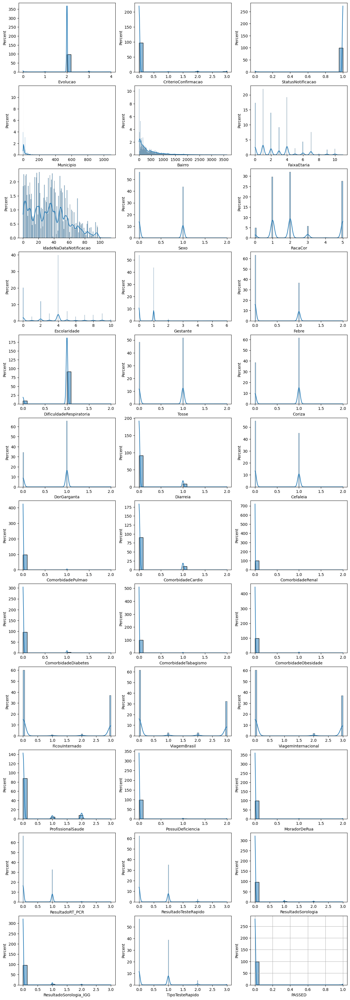

In [102]:
# HISTOGRAMA
def plot_hist(df):
    for cf in df.columns:
        df[cf] = pd.factorize(df[cf])[0]
    
    plt.figure(figsize = (15, 45))

    for i, col in enumerate(df.columns):
        plt.subplot(12, 3, i+1)
        sns.histplot(df.iloc[:, i], kde=True, stat='percent')

    plt.grid()


hist_ignore_columns = ['DataNotificacao', 'DataCadastro', 'DataDiagnostico',
        'DataColeta_RT_PCR', 'DataColetaTesteRapido', 'DataColetaSorologia',
        'DataColetaSorologiaIGG', 'DataEncerramento', 'DataObito', 'Classificacao']
plot_hist(covid_df.drop(columns=hist_ignore_columns))

### Percentual de mortes

In [103]:
def plot_percentual_deads(df):
    percentual_deads = round(df.PASSED.mean() * 100, 2)
    print(f"Percentural of deads {percentual_deads}]\n")

    ax = df.PASSED.value_counts(dropna=False).plot(kind="bar", title=f"Pacientes x Óbitos -> ({percentual_deads}%)", color=["blue", "red"], ylabel="Qtd. Pacientes")

    container = ax.containers[0]
    ax.bar_label(container)
    ax.set_xticklabels(["Recuperados", "Óbitos"], rotation=0)


Percentural of deads 1.16]



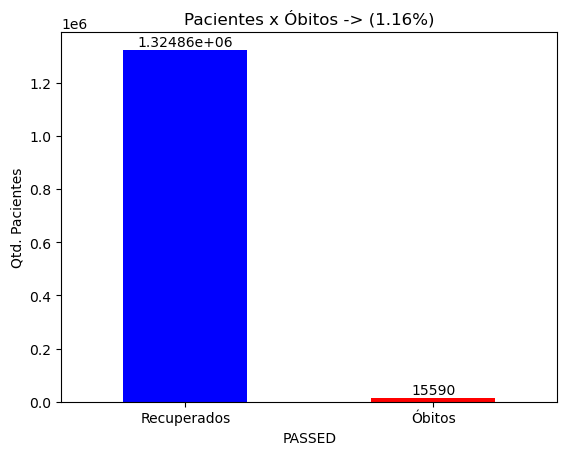

In [ ]:
plot_percentual_deads(covid_df)

### Relação idade x óbito

In [ ]:
def create_df_age_interval(df):
    age_bins = pd.cut(df['IdadeNaDataNotificacao'], bins=13, precision=0)
    df_passed_age = pd.DataFrame(columns=["Intervalo Idade", "PASSED"], data={"Intervalo Idade": age_bins, "PASSED": df.PASSED})

    return df_passed_age.groupby(['Intervalo Idade', 'PASSED']).size().unstack()

df_grouped = create_df_age_interval(covid_df)     

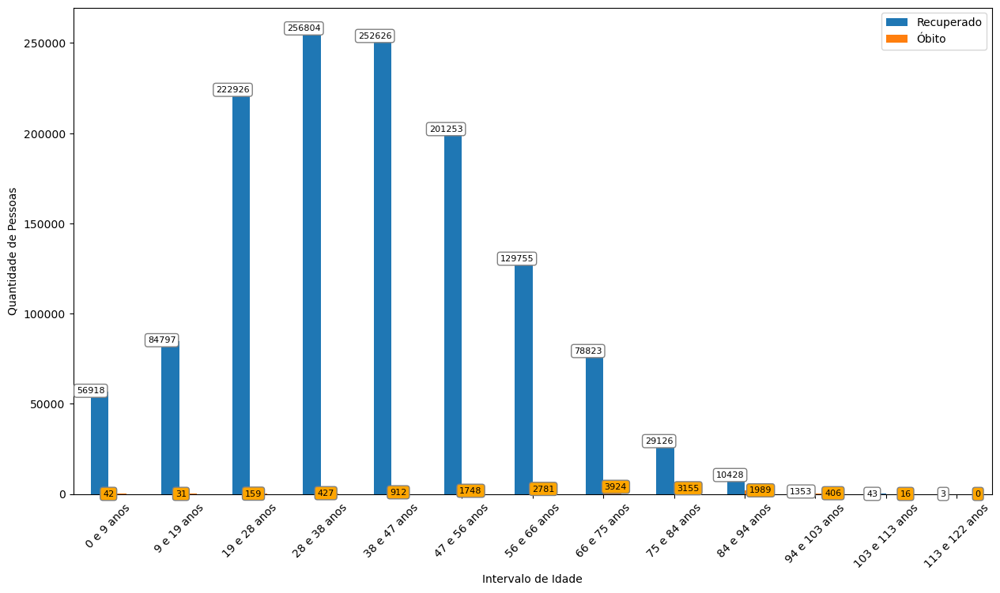

In [ ]:
def calculate_quantity_passed_by_age(df_grouped):
    # Definindo os rótulos personalizados para cada intervalo de idade
    rotulos = ['{} e {} anos'.format(int(i.left), int(i.right)) for i in df_grouped.index]


    # Plotando o gráfico de barras com os rótulos personalizados no eixo x
    ax = df_grouped.plot(kind='bar', figsize=(15, 8))
    plt.xlabel('Intervalo de Idade')
    plt.ylabel('Quantidade de Pessoas')

    # Definindo os rótulos personalizados no eixo x
    plt.xticks(range(len(rotulos)), rotulos, rotation=45)
    plt.legend(["Recuperado", "Óbito"])

    # Estilo e cores da caixa
    bbox_props = dict(boxstyle="round", fc="white", ec="gray", lw=1)  

    for i,p in enumerate(ax.patches):
        x = p.get_x() * 1.005
        y = p.get_height() * 1.005

        if(i>=13):
            bbox_props["fc"] = 'orange'
            x = p.get_x() * 1.025

            
        ax.text(x, y, str(p.get_height()), ha='center', va='center', fontsize=8, bbox=bbox_props, )

    plt.show()
    
calculate_quantity_passed_by_age(df_grouped)

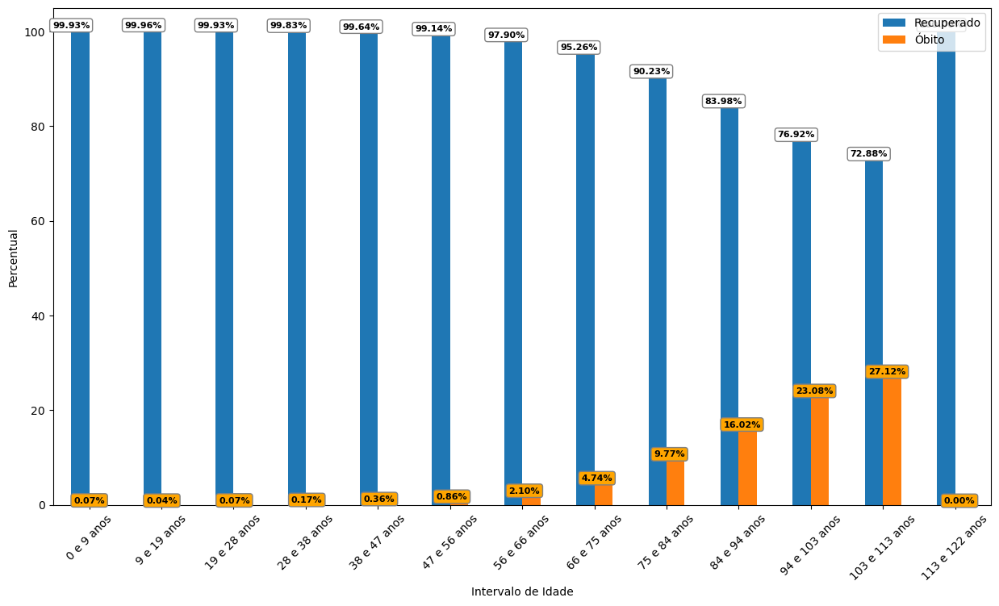

In [ ]:
def calculate_percentual_passed_by_age_interval(df_grouped):
    # Rotulos (0 a 9 anos, 9 a 19 anos, etc)
    rotulos = ['{} e {} anos'.format(int(i.left), int(i.right)) for i in df_grouped.index]

    # Calcula percentual de recuperados
    df_grouped['% Recuperados'] = (df_grouped[0]*100)/(df_grouped[0] + df_grouped[1])
    df_grouped['% Óbitos'] = 100 - df_grouped['% Recuperados']
    df_grouped_percentual = df_grouped.drop(columns=[0, 1])

    # Tipo de gráfico e suas propriedades
    ax = df_grouped_percentual.plot(kind='bar', figsize=(15, 8))
    plt.xlabel('Intervalo de Idade')
    plt.ylabel('Percentual')

    # Definindo os rótulos personalizados no eixo x
    plt.xticks(range(len(rotulos)), rotulos, rotation=45)  
    plt.legend(['Recuperado','Óbito'])

    # Estilo e cores da caixa
    bbox_props = dict(boxstyle="round", fc="white", ec="gray", lw=1)  

    for i, p in enumerate(ax.patches):
        # Posição da caixa
        x = p.get_x() * 1.005
        y = p.get_height() * 1.005
        
        # Colore de laranja apenas óbitos
        if(i>=13):
            bbox_props["fc"] = 'orange'
        ax.annotate("{:.2f}%".format(p.get_height()), (x, y), ha='center', va='bottom', fontsize=8, weight='bold', bbox=bbox_props)
    
    
calculate_percentual_passed_by_age_interval(df_grouped)

### Relação município x óbito

In [ ]:
def calculate_percentual_passed(df, column, top = 10, transf_col=True):
    # Agrupa valores por Município e PASSED
    df_grouped = df.groupby([column, "PASSED"], sort=False).size().unstack().sort_values(by=1, ascending=False)

    # Cria colunas de percentuais
    df_grouped["% Óbitos"] = df_grouped[1]/(df_grouped[0] + df_grouped[1]) * 100
    df_grouped["% Recuperados"] = df_grouped[0]/(df_grouped[0] + df_grouped[1]) * 100

    # Filtra top column com mais mortes
    df_grouped = df_grouped.sort_values(by=1, ascending=False)[:top]
    
    if(transf_col):
        df_grouped.drop(columns=[0, 1], inplace=True)
    else:
        # Altera nome das colunas
        df_grouped["Qtd. Recuperados"] = df_grouped[0]
        df_grouped["Qtd. Óbitos"] = df_grouped[1]
        df_grouped.drop(columns=[0, 1], inplace=True)


    return df_grouped

In [ ]:
df_grouped = calculate_percentual_passed(covid_df, "Municipio", transf_col=False, top=5)
df_grouped

PASSED,% Óbitos,% Recuperados,Qtd. Recuperados,Qtd. Óbitos
Municipio,,,,
VILA VELHA,1.396104,98.603896,149943.0,2123.0
SERRA,1.209720,98.790280,151323.0,1853.0
CARIACICA,1.596442,98.403558,102013.0,1655.0
VITORIA,0.978129,99.021871,150133.0,1483.0
CACHOEIRO DE ITAPEMIRIM,1.255196,98.744804,60811.0,773.0


### Relação escolaridade x óbito

In [ ]:
def show_box_bar_horizontal(ax, percentual=True):
    for i, p in enumerate(ax.patches):
        # Estilo e cores da caixa
        bbox_props = dict(boxstyle="round", fc="white", ec="gray", lw=1)  
        
        # Posição da caixa no eixo x
        pos_x = p.get_width()
        
        # Colore box de óbito
        if(i<5):
            bbox_props["fc"] = 'orange'
            pos_x += 8
    
        # Muda formato quando não é pecentual            
        box_text = "{:.2f}%"
        if(not percentual):
            box_text = "{}"

        ax.annotate(box_text.format(p.get_width()), (pos_x, p.get_y()), ha='right', va='center', fontsize=8, weight='bold', bbox=bbox_props)

def break_text(text, threshold):
    new_text_list = [f"{text[i:i+threshold]}-\n" for i in range(0, len(text), threshold)]
    new_text_string = "".join(new_text_list)
    # Remove ultimos '-\n'
    return new_text_string[:-2]

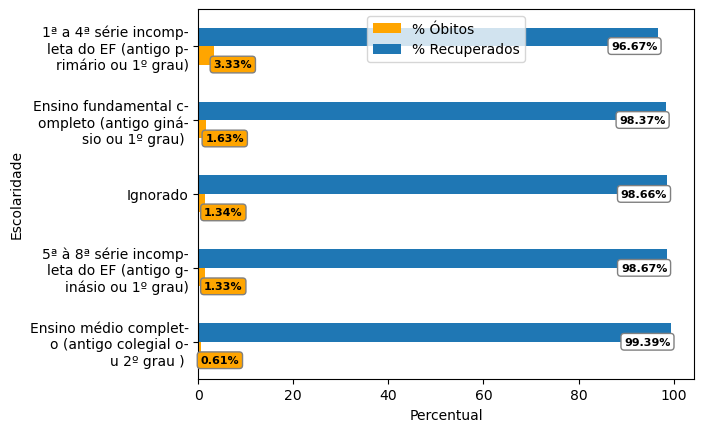

In [ ]:
def calculate_percentual_passed_education(df):
    df_grouped = calculate_percentual_passed(df, "Escolaridade", top=5).sort_values(by="% Óbitos", ascending=True)


    ax = df_grouped.plot.barh(color=["orange", "#1f77b4"])
    plt.xlabel('Percentual')
    plt.ylabel('Escolaridade')

    # Definindo os rótulos personalizados no eixo x
    labels = [break_text(label, 20) for label in df_grouped.index]
    plt.yticks(range(len(labels)), labels)
    plt.legend(['% Óbitos', "% Recuperados"], loc="upper center")

    show_box_bar_horizontal(ax)
    
        
calculate_percentual_passed_education(covid_df)


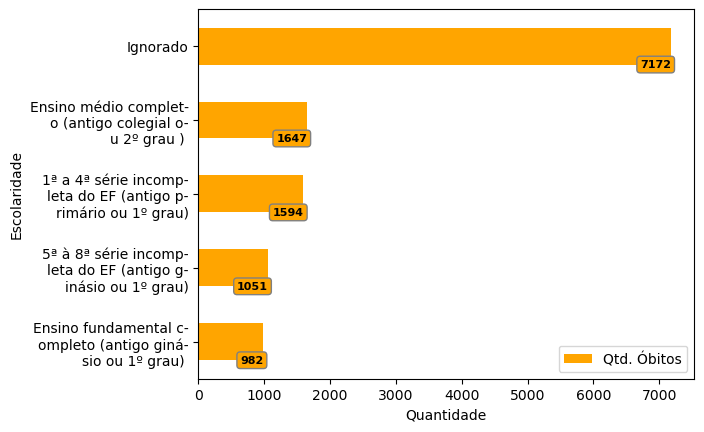

In [ ]:
def calculate_quantity_passed_education(df):
    df_grouped = calculate_percentual_passed(df, "Escolaridade", top=5, transf_col=False).sort_values(by="Qtd. Óbitos", ascending=True)
    df_grouped.drop(columns=["% Óbitos", "% Recuperados", "Qtd. Recuperados"], inplace=True)

    ax = df_grouped.plot.barh(color=["orange", "#1f77b4"])
    plt.xlabel('Quantidade')
    plt.ylabel('Escolaridade')

    # Definindo os rótulos personalizados no eixo x
    labels = [break_text(label, 20) for label in df_grouped.index]
    plt.yticks(range(len(labels)), labels)  
    plt.legend()
    show_box_bar_horizontal(ax, percentual=False)
    
calculate_quantity_passed_education(covid_df)

### Relação comorbidade x óbito

In [ ]:
def calculate_comorbidities(df):
    # Colunas de comorbidades
    comorbidities = ['ComorbidadePulmao', 'ComorbidadeCardio', 'ComorbidadeRenal',
                    'ComorbidadeDiabetes', 'ComorbidadeTabagismo', 'ComorbidadeObesidade']
    # Valor na base para 'sim' ou 1
    TRUE_VALUE = "Sim"
    FALSE_VALUE = "Não"
    
    # Cria df
    df_comorbidity = pd.DataFrame(columns=['Falecidos', 'Total', 'Falecidos %'], index=comorbidities )
    df_comorbidity.rename_axis("Comorbidades", inplace=True)
    
    for comorbidity in comorbidities:
        # Quantidade  pela comorbidade
        filter_comorbidity_death = (df[comorbidity] == TRUE_VALUE) & (df['PASSED'] == 1)
        qtd_comorbidity_dead = df[filter_comorbidity_death].shape[0]

        # Quantidade totais (apenas que morreu)
        filter_total = ((df[comorbidity] == TRUE_VALUE) | (df[comorbidity] == FALSE_VALUE)) & (df['PASSED'] == 1)
        qtd_total = len(df[filter_total])
        
        # Quantidade sobreviventes
        qtd_survival = qtd_total - qtd_comorbidity_dead
        percentual = (qtd_comorbidity_dead/qtd_total) * 100

        # Adicona valores ao df
        df_comorbidity.loc[comorbidity]['Falecidos'] = qtd_comorbidity_dead
        #df_comorbidity.loc[comorbidity]['Não Faleceu'] = qtd_survival
        df_comorbidity.loc[comorbidity]['Total'] = qtd_total
        df_comorbidity.loc[comorbidity]['Falecidos %'] = percentual



    return df_comorbidity.sort_values(by="Falecidos %", ascending=False)

calculate_comorbidities(covid_df)

,Falecidos,Total,Falecidos %
Comorbidades,,,
ComorbidadeCardio,7918,15537,50.962219
ComorbidadeDiabetes,4149,15527,26.721195
ComorbidadeObesidade,1502,15528,9.672849
ComorbidadePulmao,1168,15527,7.52238
ComorbidadeTabagismo,763,15528,4.913704
ComorbidadeRenal,739,15532,4.757919


# Tratando Dados

In [104]:
covid_df.shape

(1340445, 46)

### Coluna 'Classificacao'

In [105]:
# O dataset foi filtrado por apenas casos 'Confirmados'
# Por isso 'Classificacao', torna-se uma coluna constante, assim será removida

print(covid_df.Classificacao.value_counts(dropna=True))
covid_df.drop(columns=["Classificacao"], inplace=True)

Classificacao
Confirmados    1340445
Name: count, dtype: int64


### Tratando colunas com valor 'Ignorado', 'Não Informado' ou '-'
*   As colunas abaixo demostram exemplos dos valores 'Ignorado' e 'Não Informado'
que são recorrentes na base de dados


In [106]:
covid_df.FicouInternado.value_counts()

FicouInternado
Não              806252
Não Informado    495930
Ignorado          24337
Sim               13926
Name: count, dtype: int64

In [107]:
covid_df.DorGarganta.value_counts()

DorGarganta
Não    877843
Sim    461296
-        1306
Name: count, dtype: int64

In [108]:
covid_df.ViagemBrasil.value_counts()

ViagemBrasil
Não              826058
Não Informado    434027
Ignorado          41030
Sim               39330
Name: count, dtype: int64

In [109]:
# Converte os valores para NaN
covid_df.replace("Ignorado", np.nan, inplace=True)
covid_df.replace("Não Informado", np.nan, inplace=True)
covid_df.replace("-", np.nan, inplace=True)

### Tratando coluna 'Sexo'

In [110]:
# Valores para coluna Sexo
covid_df.Sexo.value_counts(dropna=False)

Sexo
F    755318
M    584911
I       216
Name: count, dtype: int64

In [111]:
# Redefine valor para colunas com valores I (provavelmente refere-se a indefinido)
covid_df.Sexo.replace("I", np.nan, inplace=True)

### Coluna 'Gestante'

In [112]:
# Valores usados para a coluna de Gestante
covid_df.Gestante.value_counts()

Gestante
Não                           725468
Não se aplica                 586833
3º trimeste                     2494
2º trimeste                     2171
1º trimeste                     1493
Idade gestacional ignorada       946
Name: count, dtype: int64

In [113]:
# Transformando em valores em 'Não'
# Se é mulher e 'Não se aplica', então não está grávida e homem não pode estar de gestação
covid_df.Gestante.replace("Não se aplica", "Não", inplace=True)
covid_df.Gestante.replace("Idade gestacional ignorada", "Não", inplace=True)

In [114]:
covid_df.Gestante.value_counts()

Gestante
Não            1313247
3º trimeste       2494
2º trimeste       2171
1º trimeste       1493
Name: count, dtype: int64

In [115]:
# Há ruídos que demostram gestação para pacientes do sexo masculino
covid_df[covid_df.Sexo == 'M'].Gestante.value_counts()

Gestante
Não            581103
2º trimeste         5
3º trimeste         4
1º trimeste         1
Name: count, dtype: int64

In [116]:
# Tranforma tais ruídos em 'Não'
covid_df.loc[covid_df.Sexo == 'M', "Gestante"] = "Não"
covid_df[covid_df.Sexo == 'M'].Gestante.value_counts()

Gestante
Não    584911
Name: count, dtype: int64

In [117]:
# A relação de valores 'Não', sem considerar NaN, para o total de elementos é de 97.8%
# Dessa forma, essa coluna se torna uma constante e será removida em células adiantes
covid_df.Gestante.value_counts(dropna=False)

Gestante
Não            1317055
NaN              17242
3º trimeste       2490
2º trimeste       2166
1º trimeste       1492
Name: count, dtype: int64

### Coluna 'Evolucao'

In [118]:
# Essa coluna possui informação similar a varável alvo, por isso
# precisa ser removida
covid_df.Evolucao.value_counts(dropna=True)

Evolucao
Cura                       1301677
Óbito pelo COVID-19          15112
Óbito por outras causas        448
Name: count, dtype: int64

### Colunas NaN

In [119]:
def verify_num_cols(df):
    # Média ordenada e colunas com valor vazio
    mean_na = df.isna().mean().sort_values(ascending=False)

    # Cria DF de colunas nulas
    df_na = pd.DataFrame({"percentual": mean_na})

    return df_na

def remove_nan_cols_above_limit(df, cols_to_ignore, limit=0.30):
    # Obtém colunas nulas e seu percentual
    df_na = verify_num_cols(df)

    # Ignora colunas
    df_na.drop(cols_to_ignore, inplace=True)

    # Filtra colunas pelo limite
    df_na_above_limit = df_na[df_na.percentual >= limit]

    # Obtém as colunas a serem dropadas
    columns_to_drop = df_na_above_limit.index

    # Dropa colunas
    df.drop(columns=columns_to_drop, inplace=True)

    return df, df_na_above_limit

In [120]:
# Remove colunas nulas acima do limite de 5%
# Coluna considera importante para ser removida
cols_to_ignore = ["FicouInternado"]
_, df_na = remove_nan_cols_above_limit(covid_df, cols_to_ignore, limit=0.05)

# Colunas removidas
df_na

,percentual
ResultadoSorologia,0.963691
DataColetaSorologia,0.963563
ResultadoSorologia_IGG,0.956279
DataColetaSorologiaIGG,0.956232
ResultadoRT_PCR,0.665297
DataColeta_RT_PCR,0.660597
Escolaridade,0.399611
ViagemInternacional,0.394779
TipoTesteRapido,0.393348
ViagemBrasil,0.354402


In [121]:
covid_df.shape

(1340445, 31)

In [122]:
covid_df.isna().sum()

DataNotificacao                 0
DataCadastro                    0
DataDiagnostico                 0
DataEncerramento            16515
DataObito                       0
Evolucao                    23208
CriterioConfirmacao          5393
StatusNotificacao               0
Municipio                       0
Bairro                       9100
FaixaEtaria                    32
IdadeNaDataNotificacao          0
Sexo                          216
Gestante                    17242
Febre                        1329
DificuldadeRespiratoria      1239
Tosse                        1264
Coriza                       1268
DorGarganta                  1306
Diarreia                     1278
Cefaleia                     1304
ComorbidadePulmao            1611
ComorbidadeCardio            1574
ComorbidadeRenal             1505
ComorbidadeDiabetes          1552
ComorbidadeTabagismo         1550
ComorbidadeObesidade         1741
FicouInternado             520267
PossuiDeficiencia            7304
MoradorDeRua  

### Tratando Datas

* O padrão visto nas datas é de yyyy-mm-dd, porém algumas colunas possuem valores que escapam desse padrão, assim, gerando ruídos,como por exemplo: 0202-03-21.
* Além disso, tais colunas não são necessárias.

In [123]:
covid_df.drop(columns=['DataDiagnostico', 'DataEncerramento', "DataObito","DataCadastro", "DataNotificacao"], inplace=True)

In [124]:
covid_df.columns

Index(['Evolucao', 'CriterioConfirmacao', 'StatusNotificacao', 'Municipio',
       'Bairro', 'FaixaEtaria', 'IdadeNaDataNotificacao', 'Sexo', 'Gestante',
       'Febre', 'DificuldadeRespiratoria', 'Tosse', 'Coriza', 'DorGarganta',
       'Diarreia', 'Cefaleia', 'ComorbidadePulmao', 'ComorbidadeCardio',
       'ComorbidadeRenal', 'ComorbidadeDiabetes', 'ComorbidadeTabagismo',
       'ComorbidadeObesidade', 'FicouInternado', 'PossuiDeficiencia',
       'MoradorDeRua', 'PASSED'],
      dtype='object')

### Removendo colunas desnecessárias

* Bairro/Municipio - Valores descritivos
* StatusNotificacao - Se torna constante após tratamentos
* Evolução - Possui informação similar a variável alvo
* Gestante - Coluna consante

In [125]:
# Remover DataNotificacao DataColetaTesteRapido
covid_df.drop(columns=["Bairro", "Municipio", "StatusNotificacao", "Evolucao", "Gestante"], inplace=True)

In [126]:
# Remove linhas com alguma coluna nula
covid_df.dropna(inplace=True)

In [127]:
for i in covid_df.columns:
    print(i,"----->", len(covid_df[i].unique()))

CriterioConfirmacao -----> 3
FaixaEtaria -----> 11
IdadeNaDataNotificacao -----> 113
Sexo -----> 2
Febre -----> 2
DificuldadeRespiratoria -----> 2
Tosse -----> 2
Coriza -----> 2
DorGarganta -----> 2
Diarreia -----> 2
Cefaleia -----> 2
ComorbidadePulmao -----> 2
ComorbidadeCardio -----> 2
ComorbidadeRenal -----> 2
ComorbidadeDiabetes -----> 2
ComorbidadeTabagismo -----> 2
ComorbidadeObesidade -----> 2
FicouInternado -----> 2
PossuiDeficiencia -----> 2
MoradorDeRua -----> 2
PASSED -----> 2


### Remove caracteres especiais e espaços em branco
* Quando utilizado o OneHot-Encoder, é necessário remover tais carácteres,
senão, as colunas fugirão do padrão.

In [128]:
def remove_specials_chars(char, chars_to_replace):
    if(isinstance(char, str)):
        # Remove espaçamento
        char = char.strip()
        
        # Substitui espaçamento entre palavras
        char = char.replace(" ", "_")
        
        # Remove caracter
        for c_key in chars_to_replace.keys():
            char = char.replace(c_key, chars_to_replace[c_key])
            
    return char

In [129]:
# Carácteres a serem substituídos
chars_to_replace = {'ã': 'a', 'ó': 'o', 'Ó': 'O'}

# Aplica substituição
covid_df = covid_df.applymap(lambda x: remove_specials_chars(x, chars_to_replace))

In [130]:
covid_df.PASSED.value_counts(dropna=False)

PASSED
0    801067
1     11366
Name: count, dtype: int64

# Encoding

## Label Encoding

In [131]:
label_encoder = LabelEncoder()

In [132]:
covid_df["FaixaEtaria"] = label_encoder.fit_transform(covid_df["FaixaEtaria"])

In [133]:
for i in covid_df.columns:
    print(i,"----->", len(covid_df[i].unique()))

CriterioConfirmacao -----> 3
FaixaEtaria -----> 11
IdadeNaDataNotificacao -----> 113
Sexo -----> 2
Febre -----> 2
DificuldadeRespiratoria -----> 2
Tosse -----> 2
Coriza -----> 2
DorGarganta -----> 2
Diarreia -----> 2
Cefaleia -----> 2
ComorbidadePulmao -----> 2
ComorbidadeCardio -----> 2
ComorbidadeRenal -----> 2
ComorbidadeDiabetes -----> 2
ComorbidadeTabagismo -----> 2
ComorbidadeObesidade -----> 2
FicouInternado -----> 2
PossuiDeficiencia -----> 2
MoradorDeRua -----> 2
PASSED -----> 2


## One-hot Encoding

In [134]:
# Define colunas a serem ignoradas
ignore_columns = ["FaixaEtaria", "IdadeNaDataNotificacao", "PASSED", "DataNotificacao"]
onehot_encoder_cols = [col for col in covid_df.columns.tolist() if col not in ignore_columns]

# Instancia o OneHotEnconder
one_hot_encoder = OneHotEncoder(sparse_output=False)

In [135]:
# Realiza o fit-transform
one_hot_result = one_hot_encoder.fit_transform(covid_df[onehot_encoder_cols])

# Obtem os nomes das colunas
one_hot_col_result = one_hot_encoder.get_feature_names_out(onehot_encoder_cols)

# Armazena em um novo DF
one_hot_col_df = pd.DataFrame(one_hot_result, columns=one_hot_col_result, index=covid_df.index)
one_hot_col_df.shape

(812433, 37)

In [136]:
one_hot_col_result

array(['CriterioConfirmacao_Clinico',
       'CriterioConfirmacao_Clinico_Epdemiologico',
       'CriterioConfirmacao_Laboratorial', 'Sexo_F', 'Sexo_M',
       'Febre_Nao', 'Febre_Sim', 'DificuldadeRespiratoria_Nao',
       'DificuldadeRespiratoria_Sim', 'Tosse_Nao', 'Tosse_Sim',
       'Coriza_Nao', 'Coriza_Sim', 'DorGarganta_Nao', 'DorGarganta_Sim',
       'Diarreia_Nao', 'Diarreia_Sim', 'Cefaleia_Nao', 'Cefaleia_Sim',
       'ComorbidadePulmao_Nao', 'ComorbidadePulmao_Sim',
       'ComorbidadeCardio_Nao', 'ComorbidadeCardio_Sim',
       'ComorbidadeRenal_Nao', 'ComorbidadeRenal_Sim',
       'ComorbidadeDiabetes_Nao', 'ComorbidadeDiabetes_Sim',
       'ComorbidadeTabagismo_Nao', 'ComorbidadeTabagismo_Sim',
       'ComorbidadeObesidade_Nao', 'ComorbidadeObesidade_Sim',
       'FicouInternado_Nao', 'FicouInternado_Sim',
       'PossuiDeficiencia_Nao', 'PossuiDeficiencia_Sim',
       'MoradorDeRua_Nao', 'MoradorDeRua_Sim'], dtype=object)

In [137]:
# Dropa colunas antigas e adiciona as novas
covid_df = covid_df.drop(columns=onehot_encoder_cols).join(one_hot_col_df)
covid_df.shape

(812433, 40)

In [138]:
# Liberar Memoria
del one_hot_col_df
del one_hot_result

In [139]:
covid_df.head()

,FaixaEtaria,IdadeNaDataNotificacao,PASSED,CriterioConfirmacao_Clinico,CriterioConfirmacao_Clinico_Epdemiologico,CriterioConfirmacao_Laboratorial,Sexo_F,Sexo_M,Febre_Nao,Febre_Sim,...,ComorbidadeTabagismo_Nao,ComorbidadeTabagismo_Sim,ComorbidadeObesidade_Nao,ComorbidadeObesidade_Sim,FicouInternado_Nao,FicouInternado_Sim,PossuiDeficiencia_Nao,PossuiDeficiencia_Sim,MoradorDeRua_Nao,MoradorDeRua_Sim
8,3,26,0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
11,3,26,0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
15,4,35,0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
36,3,27,0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
40,3,26,0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


# Definindo Target e Features

In [ ]:
covid_df.shape

(812433, 40)

In [ ]:
y = covid_df.PASSED
y

8          0
11         0
15         0
36         0
40         0
          ..
4897652    0
4897656    0
4897660    0
4897738    0
4897874    0
Name: PASSED, Length: 812433, dtype: int64

In [ ]:
X = covid_df.drop(columns=["PASSED"], axis=1)

# Balanceando dados (Demonstração) - Undersampling
* O gráfico em barras abaixo, demostra como estão desbalanceado os dados deste dataset

In [ ]:
# Balanceia pela classe majoritária
rus = RandomUnderSampler(sampling_strategy='majority')
X, y = rus.fit_resample(X, y)

PASSED
0    801067
1     11366
Name: count, dtype: int64


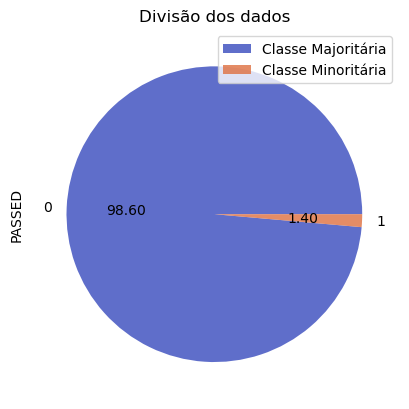

In [ ]:
# Antes
covid_df["PASSED"].value_counts().plot.pie(autopct='%.2f', colors = ['#374ABDCC', '#DE6F40CC'], ylabel="PASSED")
plt.title("Divisão dos dados")
plt.legend(["Classe Majoritária", "Classe Minoritária"], loc="upper right")
print(covid_df["PASSED"].value_counts())

Percentural of deads 1.4]



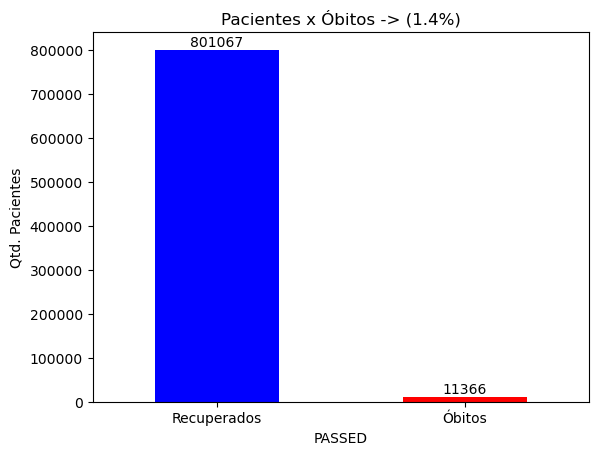

In [ ]:
# Antes
plot_percentual_deads(covid_df)

<Axes: xlabel='PASSED'>

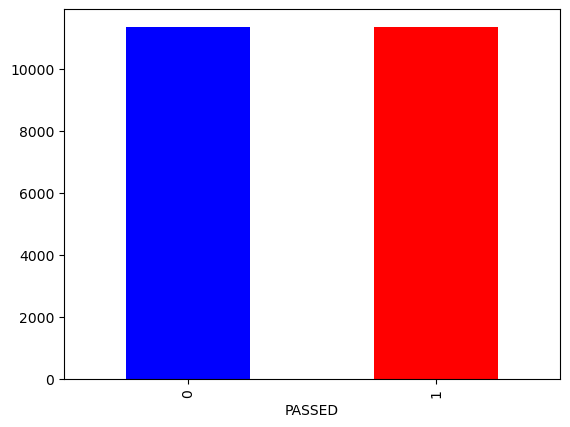

In [ ]:
y.value_counts().plot(kind="bar", color = ["blue", "red"])

In [ ]:
y.value_counts()

PASSED
0    11366
1    11366
Name: count, dtype: int64

# Funções compartilhadas

In [140]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

from sklearn.metrics import classification_report

def computes_metrics(clf, X_train, y_train, X_test, y_test, metrics):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    accuracy  = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall    = recall_score(y_test, y_pred)
    f1        = f1_score(y_test, y_pred)
    roc_auc   = roc_auc_score(y_test, y_pred)

    return accuracy, precision, recall, f1, roc_auc


def save_metrics(clf_name, metrics, resultado, index, df_results):
    for i,metrica in enumerate(metrics):
        df_results.loc[clf_name, metrica][index] = resultado[i]

def boxplot_sorted(df, score, rot=90, figsize=(8,5), fontsize=20):
    df2 = df.xs(score, level=1, drop_level=True).T
    meds = df2.median().sort_values(ascending=False)
    axes = df2[meds.index].boxplot(
                    figsize=figsize, rot=rot, fontsize=fontsize,
                    boxprops=dict(linewidth=4, color='cornflowerblue'),
                    whiskerprops=dict(linewidth=4, color='cornflowerblue'),
                    medianprops=dict(linewidth=4, color='firebrick'),
                    capprops=dict(linewidth=4, color='cornflowerblue'),
                    flierprops=dict(marker='o', markerfacecolor='dimgray',
                                    markersize=12, markeredgecolor='black'),
                    return_type="axes")

    axes.set_title(f'Boxplots of {score} metric',
                   fontsize=fontsize)
    plt.show()

# Ajuste de hiperparâmetros

## Preparando dados

In [141]:
def prepare_data_hiper_params(df, class_target):
    # Realiza RUS na classe majoritária
    rus = RandomUnderSampler(sampling_strategy="majority")
    X_rus, y_rus = rus.fit_resample(df.drop(columns=[class_target]), df[class_target])
    
    return X_rus, y_rus

## Funções Auxiliares

In [142]:
# Classe que envolve o nome, modelo e seus parâmetros
class ModelWrapper():
    def __init__(self, name, params_grid={}):
        self.name = name
        self.params_grid = params_grid
        self.best_params = {}
        self.model = None
        
    def get_name(self):
        return self.name

    def get_model(self):
        if(self.model is None):
            return self.init_model()
        return self.model

    def get_params_grid(self):
        return self.params_grid
    
    def get_best_params(self):
        return self.best_params
    
    def set_best_params(self, best_params):
        self.best_params = best_params
    
    def factory_model(self):
        if(self.name == "LR"):
            return LogisticRegression(**self.best_params)
            
        elif(self.name == "RF"):
            return RandomForestClassifier(**self.best_params)
            
        elif(self.name == "XGBoost"):
            return XGBClassifier(**self.best_params)
            
        elif(self.name == "CatBoost"):
            return CatBoostClassifier(**self.best_params)
            
        else:
            raise ValueError(f"The estimator {self.name} is not implemented.")
    
    def init_model(self):
        # Força liberar memoria de self.model
        if(self.model is not None):
            del self.model
            self.model = None
        self.model = self.factory_model()
        return self.model

In [143]:
def init_clfs():
    return [
        ModelWrapper('LR',  {
            'max_iter': [2000, 2300, 2500, 3000],
            'class_weight': ['balanced', None],
            'solver': ['lbfgs', 'liblinear']}),
        
        ModelWrapper('RF', {
            'n_estimators': [100, 400, 1000, 2000],
            'max_depth': [1, 3, 6, 8],
        }),
        
        ModelWrapper('XGBoost', {
            'n_estimators': [100, 400, 1000, 2000],
            'max_depth': [1, 3, 6, 8],
        }),
         ModelWrapper('CatBoost', {
            'n_estimators': [100, 400, 1000, 2000],
            'max_depth': [1, 3, 6, 8],
        })
    ]

def save_results_in_file(df_results):
    date_time = datetime.now().strftime('%Y%m%d_%H%M%S')
    filename = f'./results/es_tb_results_{date_time}'
    
    df_results.to_csv(filename)

## Execução

In [144]:
# Instancia classificadores e busca seus melhores parâmetros
def tuning_hyperparameters(df, target, balanced=True, stratified=False):
    if stratified:
        # Agrupa por PASSED e aplica o SAMPLE em cada grupo
        df = df.groupby(target, group_keys=False).apply(lambda g: g.sample(frac=0.2))
        
    # Define características e variável alvo
    X_train = df.drop(columns=[target])
    y_train = df[target]
    
    # Inicia os modelos
    clfs = init_clfs()
    best_clfs = {}
        
    if balanced:
        # Dados com RUS
        X_train, y_train = prepare_data_hiper_params(df, target)

    # Itera classificadores
    for clf in clfs:
        # Executa hiper-parâmetros no classificador
        grid = GridSearchCV(estimator = clf.get_model(), param_grid = clf.get_params_grid(), cv = 5)
        grid.fit(X_train, y_train)

        # Armazena melhores parâmetros
        best_clfs[clf.get_name()] = grid.best_params_
        clf.set_best_params(grid.best_params_)
        
    return clfs, pd.DataFrame(best_clfs)

best_clfs, df_bests_clfs = tuning_hyperparameters(covid_df, "PASSED")
df_bests_clfs

Learning rate set to 0.293651
0:	learn: 0.5158995	total: 162ms	remaining: 16s
1:	learn: 0.4520559	total: 166ms	remaining: 8.12s
2:	learn: 0.4110228	total: 170ms	remaining: 5.5s
3:	learn: 0.3804327	total: 174ms	remaining: 4.18s
4:	learn: 0.3585500	total: 178ms	remaining: 3.39s
5:	learn: 0.3266722	total: 183ms	remaining: 2.86s
6:	learn: 0.3150376	total: 187ms	remaining: 2.48s
7:	learn: 0.3040756	total: 191ms	remaining: 2.19s
8:	learn: 0.2965435	total: 195ms	remaining: 1.97s
9:	learn: 0.2899637	total: 199ms	remaining: 1.79s
10:	learn: 0.2803110	total: 203ms	remaining: 1.64s
11:	learn: 0.2754404	total: 207ms	remaining: 1.52s
12:	learn: 0.2712323	total: 211ms	remaining: 1.41s
13:	learn: 0.2677266	total: 215ms	remaining: 1.32s
14:	learn: 0.2637071	total: 219ms	remaining: 1.24s
15:	learn: 0.2609093	total: 223ms	remaining: 1.17s
16:	learn: 0.2583699	total: 227ms	remaining: 1.11s
17:	learn: 0.2561476	total: 232ms	remaining: 1.05s
18:	learn: 0.2543507	total: 236ms	remaining: 1s
19:	learn: 0.2527

,LR,RF,XGBoost,CatBoost
class_weight,None,NaN,NaN,NaN
max_iter,2000,NaN,NaN,NaN
solver,liblinear,NaN,NaN,NaN
max_depth,NaN,8.0,3.0,3.0
n_estimators,NaN,1000.0,100.0,1000.0


# Validação cruzada

## Execução

In [145]:
def execute_models(df, target, best_clfs, balanced=True):
    # Settings
    TEST_SIZE = 0.3
    TRAIN_SIZE = 0.7
    n_rodadas = 30

    Clfs_names = [ 'LR', 'RF', 'XGBoost', 'CatBoost']
    metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    m_index = pd.MultiIndex.from_product([Clfs_names, metrics])

    # Atributos e Alvo
    X = df.drop(columns=[target])
    y = df[target]
        
    df_results = pd.DataFrame(data=np.zeros((len(m_index), n_rodadas)), index=m_index)

    for col in range(n_rodadas):

        if balanced:
            # RandomUnderSampler
            rus = RandomUnderSampler(sampling_strategy='majority')
            X, y = rus.fit_resample(X, y)
        
        # Hold out
        X_train, X_test,\
        y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, stratify=y)
        
        for best_clf in best_clfs:
            # Reseta/Inicia modelo com seus melhores parâmetros
            clf_model = best_clf.init_model()
           
            #Treina o modelo utilizando o conjunto de teste
            metrics_results = computes_metrics(clf_model, X_train, y_train, X_test, y_test, metrics)
            save_metrics(best_clf.get_name(), metrics, metrics_results, col, df_results)
            
    return df_results

In [146]:
df_results = execute_models(covid_df, "PASSED", best_clfs)
save_results_in_file(df_results)
df_results

Learning rate set to 0.033579
0:	learn: 0.6535051	total: 8.26ms	remaining: 8.26s
1:	learn: 0.6197148	total: 15.7ms	remaining: 7.85s
2:	learn: 0.5872765	total: 23.2ms	remaining: 7.72s
3:	learn: 0.5580298	total: 31.2ms	remaining: 7.76s
4:	learn: 0.5348268	total: 39.6ms	remaining: 7.88s
5:	learn: 0.5114391	total: 48ms	remaining: 7.95s
6:	learn: 0.4894614	total: 55.9ms	remaining: 7.93s
7:	learn: 0.4711694	total: 63.9ms	remaining: 7.92s
8:	learn: 0.4542728	total: 71.5ms	remaining: 7.87s
9:	learn: 0.4377119	total: 79.2ms	remaining: 7.84s
10:	learn: 0.4227652	total: 86.7ms	remaining: 7.8s
11:	learn: 0.4099344	total: 94.2ms	remaining: 7.76s
12:	learn: 0.3979411	total: 101ms	remaining: 7.7s
13:	learn: 0.3875072	total: 109ms	remaining: 7.69s
14:	learn: 0.3777669	total: 117ms	remaining: 7.66s
15:	learn: 0.3687463	total: 124ms	remaining: 7.62s
16:	learn: 0.3626498	total: 131ms	remaining: 7.57s
17:	learn: 0.3551319	total: 138ms	remaining: 7.55s
18:	learn: 0.3482485	total: 146ms	remaining: 7.54s
19:

0         1         2         3         4   \
LR       accuracy   0.913636  0.910117  0.915836  0.911877  0.913196   
         precision  0.926778  0.927545  0.931790  0.931225  0.924910   
         recall     0.898240  0.889736  0.897361  0.889443  0.899413   
         f1         0.912286  0.908247  0.914252  0.909855  0.911983   
         roc_auc    0.913636  0.910117  0.915836  0.911877  0.913196   
RF       accuracy   0.910117  0.912023  0.914223  0.911290  0.910704   
         precision  0.919340  0.928354  0.924047  0.928244  0.919186   
         recall     0.899120  0.892962  0.902639  0.891496  0.900587   
         f1         0.909118  0.910314  0.913218  0.909499  0.909791   
         roc_auc    0.910117  0.912023  0.914223  0.911290  0.910704   
XGBoost  accuracy   0.912317  0.912023  0.915689  0.915249  0.912903   
         precision  0.922222  0.924215  0.925804  0.930657  0.919547   
         recall     0.900587  0.897654  0.903812  0.897361  0.904985   
         f1         0.911276  0.910741  0.914676  0.913706  0.912208   
         roc_auc    0.912317  0.912023  0.915689  0.915249  0.912903   
CatBoost accuracy   0.914663  0.913050  0.917449  0.914370  0.914516   
         precision  0.925647  0.925400  0.928120  0.930530  0.923330   
         recall     0.901760  0.898534  0.904985  0.895601  0.904106   
         f1         0.913547  0.911769  0.916407  0.912732  0.913617   
         roc_auc    0.914663  0.913050  0.917449  0.914370  0.914516   

                          5         6         7         8         9   ...  \
LR       accuracy   0.909677  0.915543  0.914663  0.910264  0.915689  ...   
         precision  0.924104  0.927064  0.928225  0.930462  0.926572  ...   
         recall     0.892669  0.902053  0.898827  0.886804  0.902933  ...   
         f1         0.908115  0.914388  0.913290  0.908108  0.914600  ...   
         roc_auc    0.909677  0.915543  0.914663  0.910264  0.915689  ...   
RF       accuracy   0.908065  0.911730  0.913490  0.908944  0.912610  ...   
         precision  0.917993  0.920108  0.923678  0.928155  0.918750  ...   
         recall     0.896188  0.901760  0.901466  0.886510  0.905279  ...   
         f1         0.906959  0.910841  0.912437  0.906855  0.911965  ...   
         roc_auc    0.908065  0.911730  0.913490  0.908944  0.912610  ...   
XGBoost  accuracy   0.911290  0.914370  0.913050  0.908504  0.917449  ...   
         precision  0.920540  0.922295  0.921833  0.926516  0.922529  ...   
         recall     0.900293  0.904985  0.902639  0.887390  0.911437  ...   
         f1         0.910304  0.913558  0.912135  0.906531  0.916949  ...   
         roc_auc    0.911290  0.914370  0.913050  0.908504  0.917449  ...   
CatBoost accuracy   0.910850  0.915396  0.914663  0.909384  0.918475  ...   
         precision  0.920216  0.921703  0.925904  0.927173  0.925462  ...   
         recall     0.899707  0.907918  0.901466  0.888563  0.910264  ...   
         f1         0.909846  0.914758  0.913522  0.907457  0.917800  ...   
         roc_auc    0.910850  0.915396  0.914663  0.909384  0.918475  ...   

                          20        21        22        23        24  \
LR       accuracy   0.914956  0.908065  0.910117  0.912317  0.910264   
         precision  0.932722  0.923334  0.928069  0.931288  0.927306   
         recall     0.894428  0.890029  0.889150  0.890323  0.890323   
         f1         0.913174  0.906376  0.908192  0.910345  0.908438   
         roc_auc    0.914956  0.908065  0.910117  0.912317  0.910264   
RF       accuracy   0.912757  0.906012  0.908944  0.907478  0.908504   
         precision  0.926386  0.913654  0.925542  0.920933  0.920592   
         recall     0.896774  0.896774  0.889443  0.891496  0.894135   
         f1         0.911340  0.905135  0.907133  0.905975  0.907170   
         roc_auc    0.912757  0.906012  0.908944  0.907478  0.908504   
XGBoost  accuracy   0.915689  0.909384  0.911290  0.912317  0.912023   
         precision  0.928896  0

## Resultado

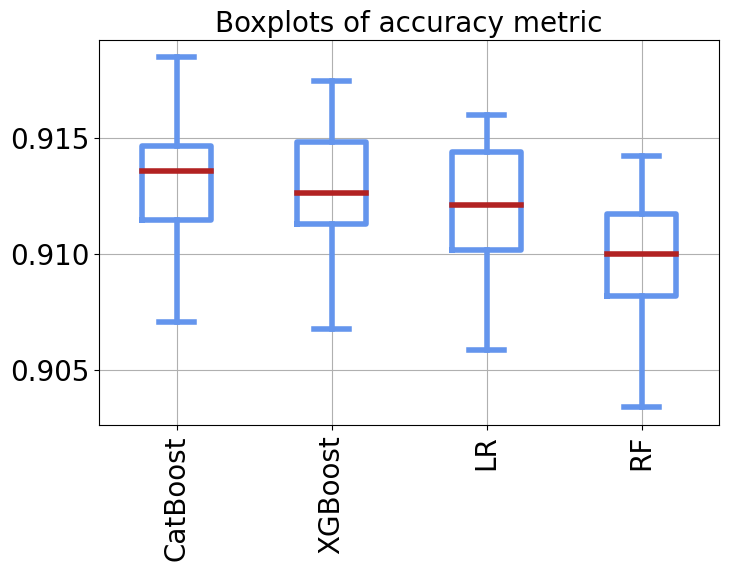

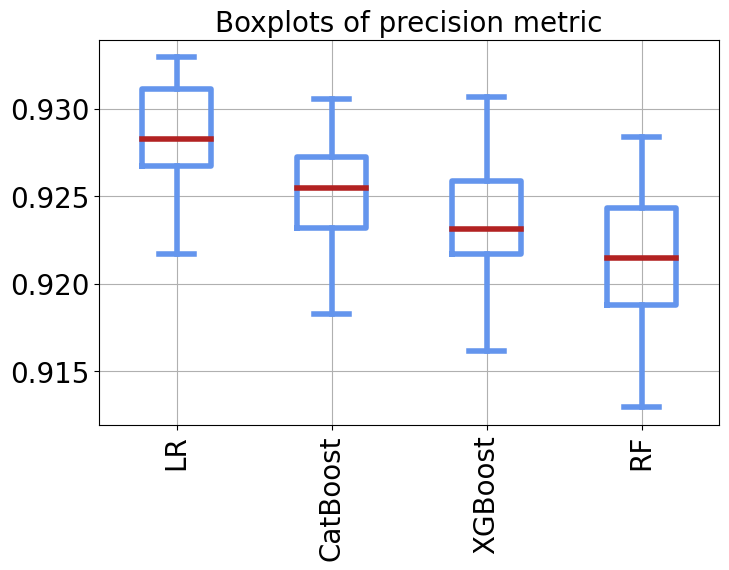

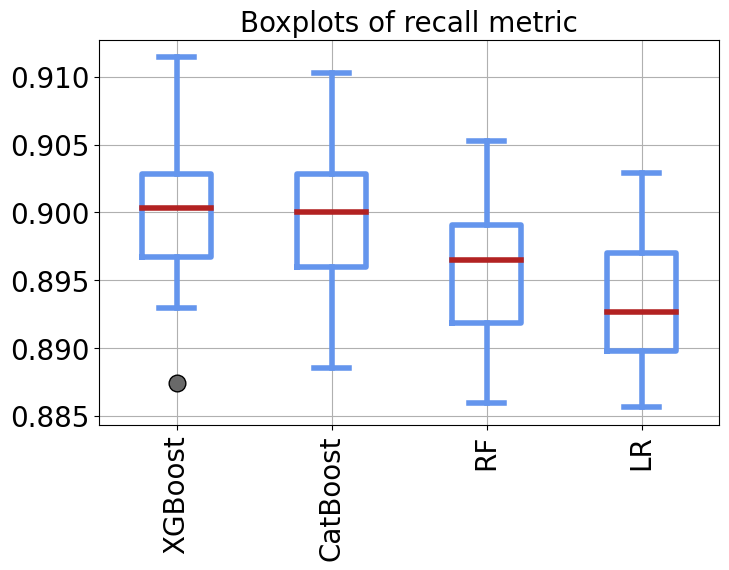

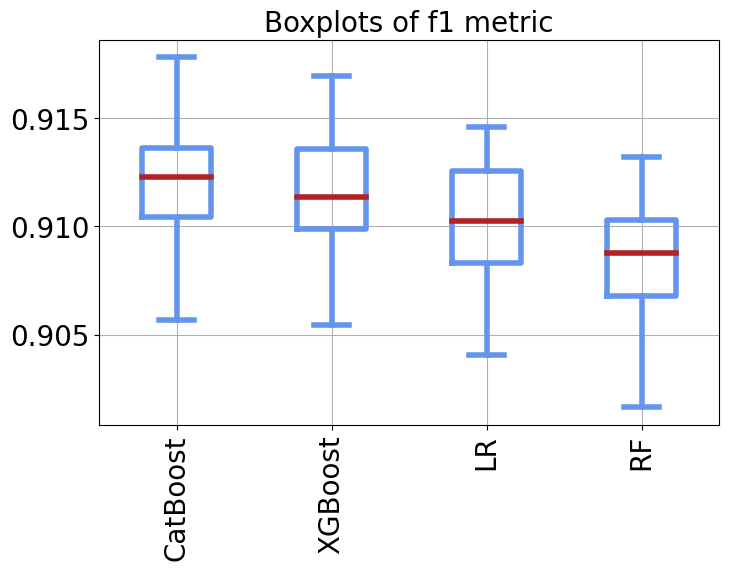

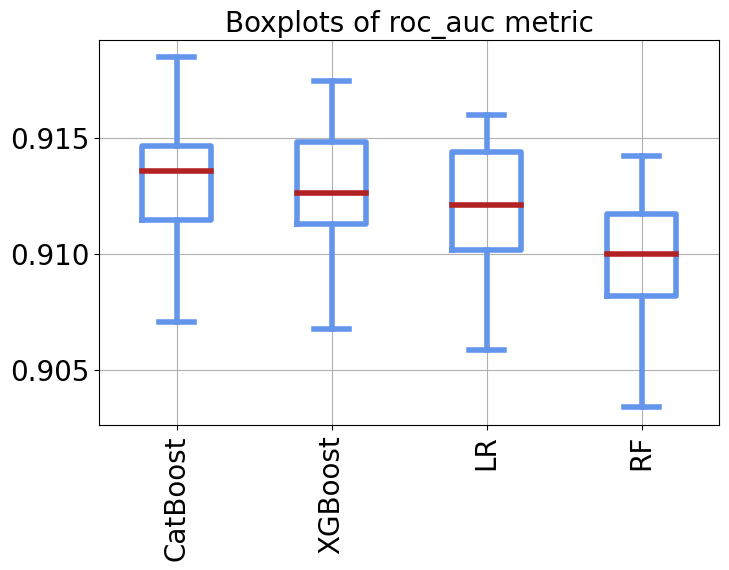

In [147]:
# Plota bloxpot das métricas
metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
for metrica in metrics:
    boxplot_sorted(df_results, metrica, rot=90, figsize=(8,5), fontsize=20)


# Método SHAPley

### Melhor Classificador

In [148]:
name_best_clf = "CatBoost"
best_clf = list(filter(lambda m: m.get_name() == name_best_clf, best_clfs))[0]

### Remover variáveis redundantes

In [149]:
# Remove variaveis redudantes
# Obtém colunas com _Nao ou _M
columns_names = [col for col in covid_df.columns if "_Nao" in col or "_M" in col]
covid_df.drop(columns=columns_names, inplace=True)

In [150]:
def remover_text_in_column(df):
    for coluna in df.columns:
        if coluna.endswith("_Sim"):
            df.rename(columns={coluna: coluna.replace("_Sim", "")}, inplace=True)
        elif coluna.endswith("_F"):
            df.rename(columns={coluna: coluna.replace("_F", "")}, inplace=True)

    return df

In [151]:
covid_df = remover_text_in_column(covid_df)

### Funções auxiliares

In [152]:
def run_model(clf_model, X, y, test_size, balanced=True):
    # Balanceia os dados quano necessário
    if balanced:
        rus = RandomUnderSampler(sampling_strategy='majority')
        X, y = rus.fit_resample(X, y)
    
    # Split dos dados
    X_train, X_test, \
    y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y)

    # Realiza o fit do modelo
    clf_model.fit(X_train, y_train.values.ravel())
    y_pred = clf_model.predict(X_test)

    # Calcula a acurácia
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy


def shap_analysis(clf_model, X):
    # Gera o Tree explainer e SHAP values
    explainer = shap.TreeExplainer(clf_model)
    shap_values = explainer.shap_values(X)
    shap_obj    = explainer(X)
    expected_value = explainer.expected_value

    return shap_values, shap_obj

def summary_plot(shap_values, X, figname, plot_type="dot"):
    # Gera summary dot plot
    shap.summary_plot(shap_values, X, title="SHAP summary plot", show=False, plot_type=plot_type)

    # Gera summary bar plot
    plt.savefig(figname, format='pdf', dpi=600, bbox_inches='tight')
    plt.show()

### SHAP - Análises individuais

In [153]:
def generate_summary_plots(best_clf, X, y, test_size=0.20, n_times=10,
                           fileprefix='shap_summary_plot', filesuffix='', balanced=True):

    # Prefixo do arquivo
    date_time = datetime.now().strftime('%Y%m%d_%H%M%S')
    fileprefix = f'{fileprefix}_{date_time}'

    for i in range(n_times):
        
        # Reinicializa melhor modelo
        clf_model = best_clf.init_model()
        
        # Calcula acurácia
        accuracy = run_model(clf_model, X, y, test_size, balanced)

        # Realiza a análise shap
        shap_values, shap_obj = shap_analysis(clf_model, X)

        # Salva arquivo e plota figura
        figname = f'{fileprefix}_{filesuffix}_{i}_{int(accuracy*100)}.pdf'
        summary_plot(shap_values, X, figname)
        
def run_separated_shaps(df, fileprefix,
                        best_clf,
                        test_size=0.25, n_times=10, balanced=True):

    # Define características e alvo
    X  = df.drop(columns='PASSED')
    y  = df['PASSED'].to_frame()

    filesuffix = f'{best_clf.get_name()}'

    generate_summary_plots(best_clf, X, y,
                            test_size=test_size, n_times=n_times,
                            fileprefix=fileprefix, filesuffix=filesuffix, balanced=balanced)

Learning rate set to 0.159244
0:	learn: 0.3681461	total: 43.3ms	remaining: 43.3s
1:	learn: 0.1892624	total: 90.3ms	remaining: 45s
2:	learn: 0.1098146	total: 117ms	remaining: 38.9s
3:	learn: 0.0759764	total: 145ms	remaining: 36.2s
4:	learn: 0.0599318	total: 171ms	remaining: 34.1s
5:	learn: 0.0509104	total: 200ms	remaining: 33.2s
6:	learn: 0.0460293	total: 228ms	remaining: 32.4s
7:	learn: 0.0430695	total: 257ms	remaining: 31.9s
8:	learn: 0.0410467	total: 281ms	remaining: 31s
9:	learn: 0.0394196	total: 307ms	remaining: 30.4s
10:	learn: 0.0383777	total: 335ms	remaining: 30.1s
11:	learn: 0.0377632	total: 367ms	remaining: 30.2s
12:	learn: 0.0373552	total: 390ms	remaining: 29.6s
13:	learn: 0.0368806	total: 414ms	remaining: 29.2s
14:	learn: 0.0364490	total: 438ms	remaining: 28.8s
15:	learn: 0.0362744	total: 466ms	remaining: 28.7s
16:	learn: 0.0360084	total: 493ms	remaining: 28.5s
17:	learn: 0.0358246	total: 532ms	remaining: 29s
18:	learn: 0.0356626	total: 557ms	remaining: 28.8s
19:	learn: 0.03

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


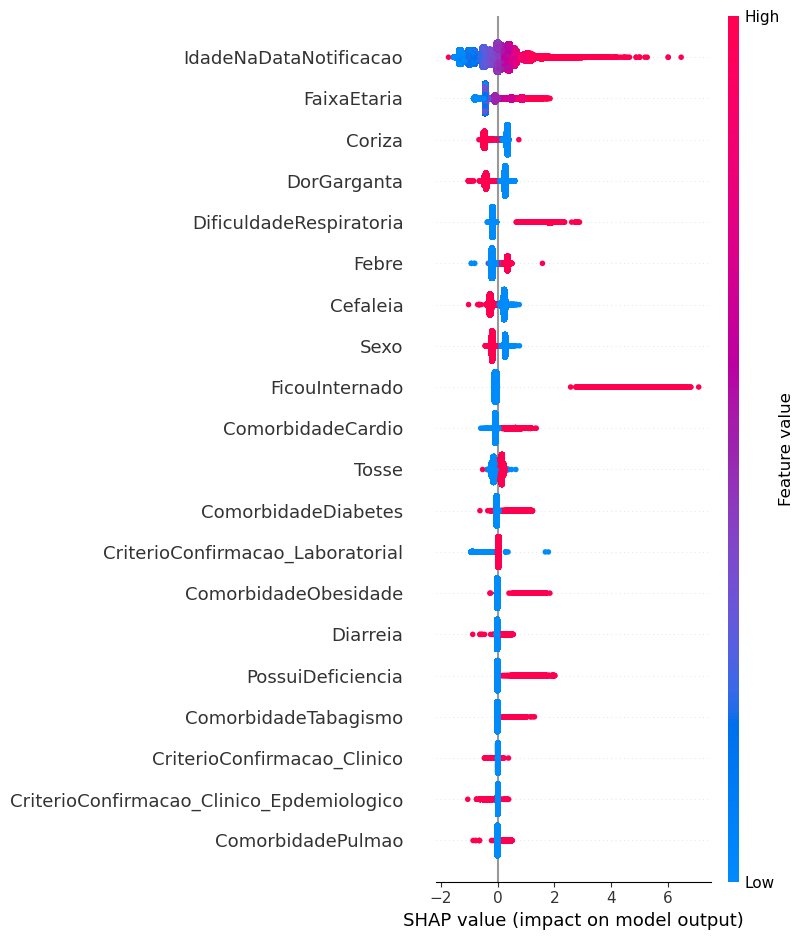

Learning rate set to 0.159244
0:	learn: 0.3679406	total: 32.9ms	remaining: 32.9s
1:	learn: 0.1898176	total: 59.5ms	remaining: 29.7s
2:	learn: 0.1121686	total: 83.7ms	remaining: 27.8s
3:	learn: 0.0760596	total: 117ms	remaining: 29s
4:	learn: 0.0594099	total: 147ms	remaining: 29.3s
5:	learn: 0.0511765	total: 175ms	remaining: 28.9s
6:	learn: 0.0461264	total: 198ms	remaining: 28.1s
7:	learn: 0.0431529	total: 225ms	remaining: 28s
8:	learn: 0.0411422	total: 254ms	remaining: 27.9s
9:	learn: 0.0395108	total: 281ms	remaining: 27.8s
10:	learn: 0.0386459	total: 314ms	remaining: 28.2s
11:	learn: 0.0380433	total: 341ms	remaining: 28.1s
12:	learn: 0.0376054	total: 366ms	remaining: 27.8s
13:	learn: 0.0369998	total: 390ms	remaining: 27.5s
14:	learn: 0.0365108	total: 414ms	remaining: 27.2s
15:	learn: 0.0362934	total: 439ms	remaining: 27s
16:	learn: 0.0360161	total: 464ms	remaining: 26.8s
17:	learn: 0.0358386	total: 488ms	remaining: 26.6s
18:	learn: 0.0357196	total: 511ms	remaining: 26.4s
19:	learn: 0.0

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


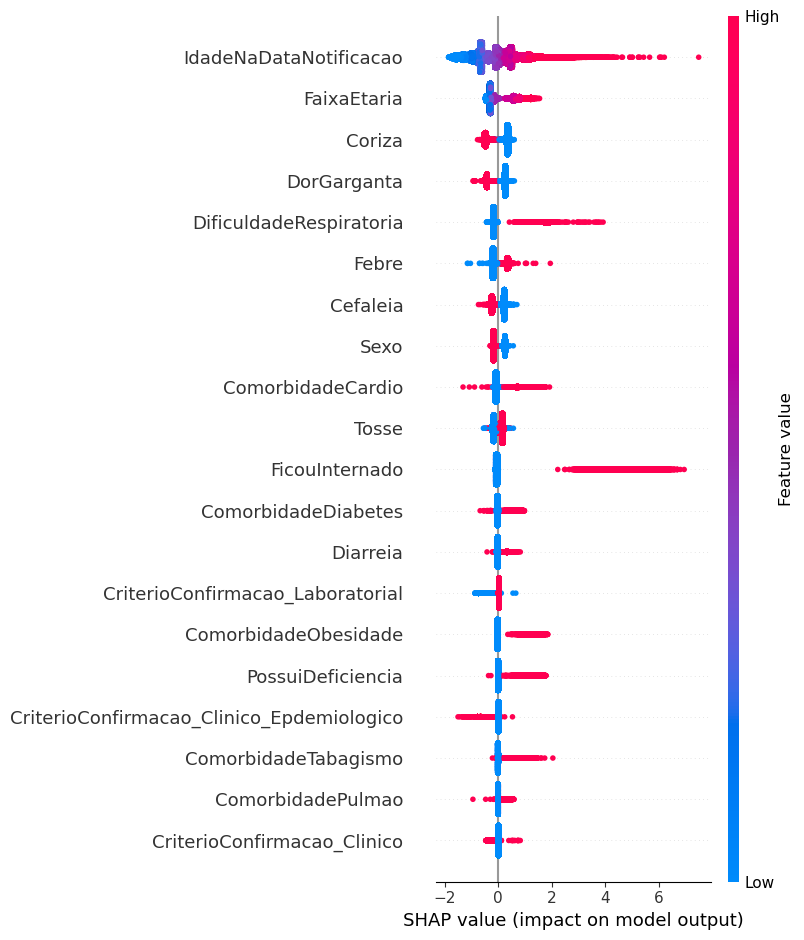

Learning rate set to 0.159244
0:	learn: 0.3677634	total: 29.6ms	remaining: 29.6s
1:	learn: 0.1902601	total: 54.7ms	remaining: 27.3s
2:	learn: 0.1096312	total: 78.3ms	remaining: 26s
3:	learn: 0.0761627	total: 104ms	remaining: 26s
4:	learn: 0.0597118	total: 128ms	remaining: 25.4s
5:	learn: 0.0514238	total: 163ms	remaining: 27.1s
6:	learn: 0.0460678	total: 186ms	remaining: 26.4s
7:	learn: 0.0430858	total: 228ms	remaining: 28.2s
8:	learn: 0.0405720	total: 251ms	remaining: 27.7s
9:	learn: 0.0393047	total: 275ms	remaining: 27.3s
10:	learn: 0.0383348	total: 301ms	remaining: 27.1s
11:	learn: 0.0377743	total: 327ms	remaining: 26.9s
12:	learn: 0.0370673	total: 348ms	remaining: 26.4s
13:	learn: 0.0367058	total: 374ms	remaining: 26.3s
14:	learn: 0.0363632	total: 397ms	remaining: 26s
15:	learn: 0.0361493	total: 419ms	remaining: 25.7s
16:	learn: 0.0358808	total: 441ms	remaining: 25.5s
17:	learn: 0.0357636	total: 467ms	remaining: 25.5s
18:	learn: 0.0355710	total: 492ms	remaining: 25.4s
19:	learn: 0.0

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


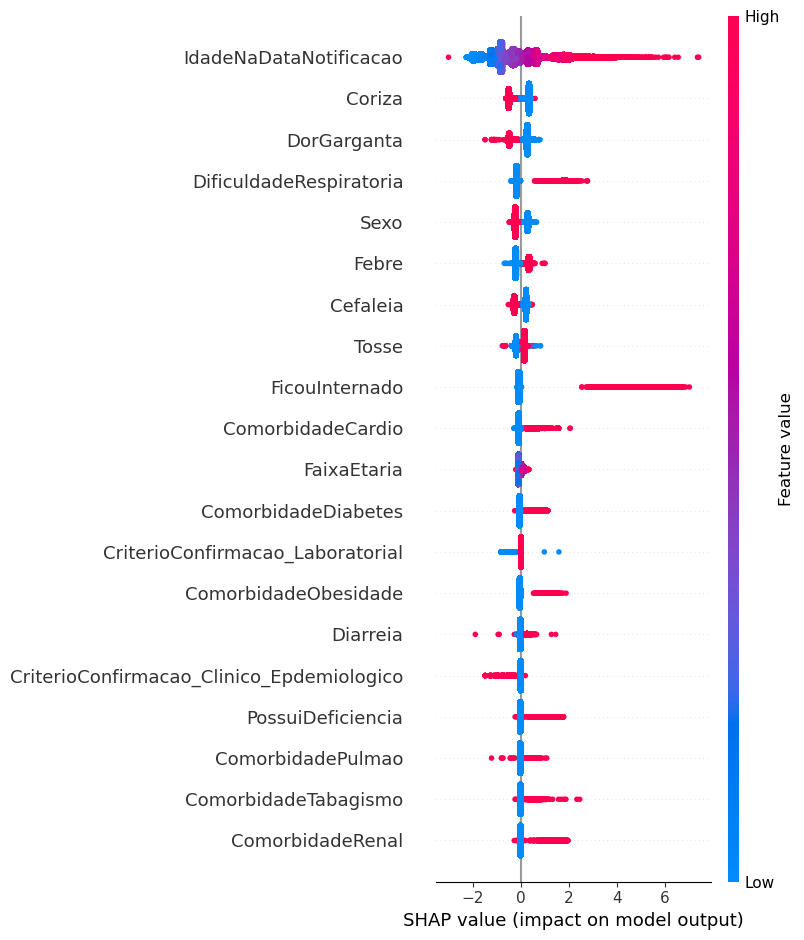

Learning rate set to 0.159244
0:	learn: 0.3674688	total: 44.4ms	remaining: 44.4s
1:	learn: 0.1894095	total: 74.1ms	remaining: 37s
2:	learn: 0.1118445	total: 97.8ms	remaining: 32.5s
3:	learn: 0.0771786	total: 124ms	remaining: 30.9s
4:	learn: 0.0613036	total: 151ms	remaining: 30.1s
5:	learn: 0.0516434	total: 177ms	remaining: 29.4s
6:	learn: 0.0464245	total: 201ms	remaining: 28.5s
7:	learn: 0.0433078	total: 227ms	remaining: 28.2s
8:	learn: 0.0407652	total: 253ms	remaining: 27.8s
9:	learn: 0.0395363	total: 277ms	remaining: 27.4s
10:	learn: 0.0387587	total: 301ms	remaining: 27.1s
11:	learn: 0.0377238	total: 323ms	remaining: 26.6s
12:	learn: 0.0373328	total: 364ms	remaining: 27.6s
13:	learn: 0.0367660	total: 385ms	remaining: 27.1s
14:	learn: 0.0364704	total: 407ms	remaining: 26.7s
15:	learn: 0.0362246	total: 429ms	remaining: 26.4s
16:	learn: 0.0360387	total: 452ms	remaining: 26.1s
17:	learn: 0.0358652	total: 475ms	remaining: 25.9s
18:	learn: 0.0357037	total: 496ms	remaining: 25.6s
19:	learn:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


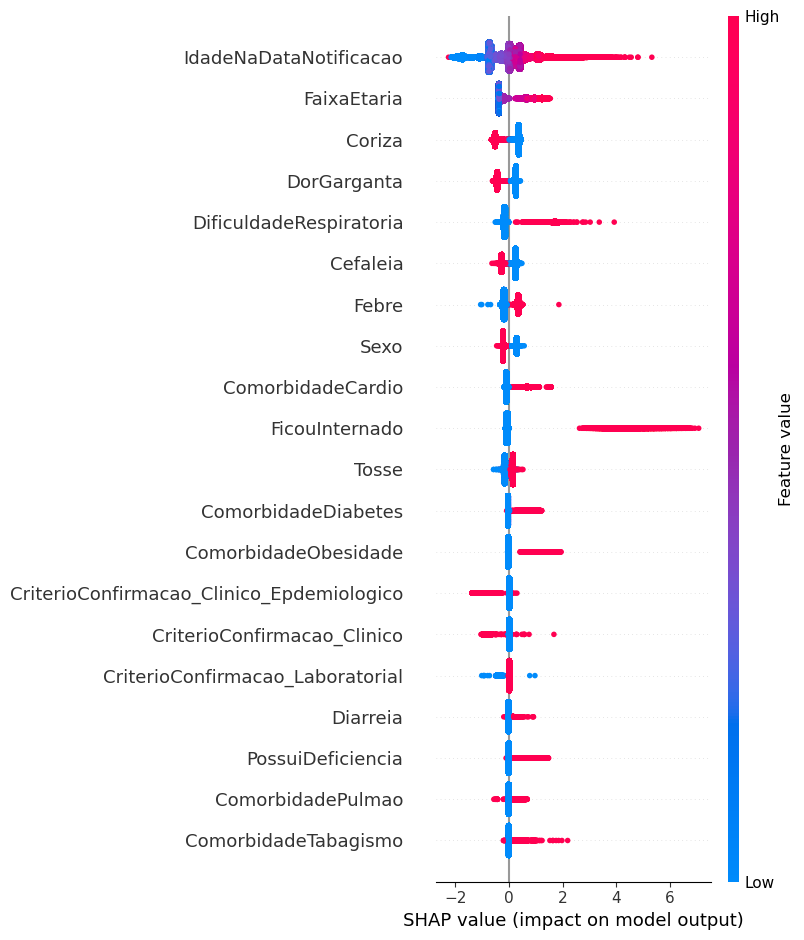

Learning rate set to 0.159244
0:	learn: 0.3677978	total: 27.1ms	remaining: 27.1s
1:	learn: 0.1896077	total: 52.8ms	remaining: 26.3s
2:	learn: 0.1119247	total: 77.3ms	remaining: 25.7s
3:	learn: 0.0759665	total: 101ms	remaining: 25.1s
4:	learn: 0.0592995	total: 127ms	remaining: 25.3s
5:	learn: 0.0511897	total: 153ms	remaining: 25.4s
6:	learn: 0.0460804	total: 176ms	remaining: 24.9s
7:	learn: 0.0427772	total: 203ms	remaining: 25.2s
8:	learn: 0.0409042	total: 237ms	remaining: 26.1s
9:	learn: 0.0396345	total: 260ms	remaining: 25.7s
10:	learn: 0.0385215	total: 284ms	remaining: 25.5s
11:	learn: 0.0379069	total: 312ms	remaining: 25.7s
12:	learn: 0.0372053	total: 334ms	remaining: 25.4s
13:	learn: 0.0369208	total: 357ms	remaining: 25.1s
14:	learn: 0.0365726	total: 379ms	remaining: 24.9s
15:	learn: 0.0363220	total: 400ms	remaining: 24.6s
16:	learn: 0.0361022	total: 423ms	remaining: 24.4s
17:	learn: 0.0359358	total: 445ms	remaining: 24.3s
18:	learn: 0.0357810	total: 467ms	remaining: 24.1s
19:	lear

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


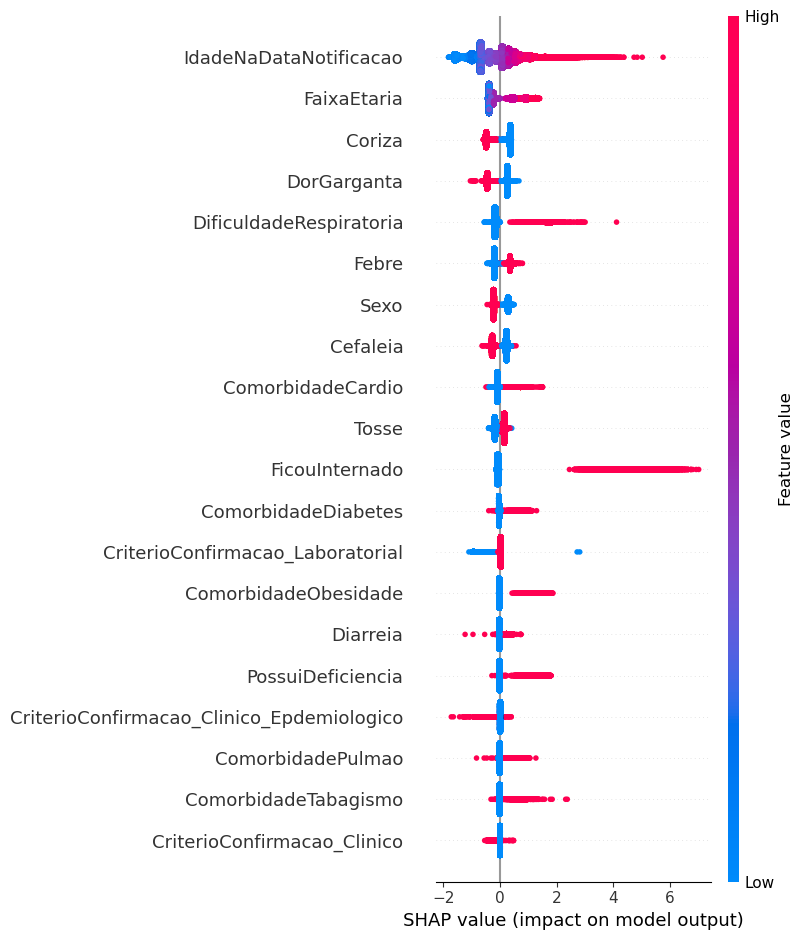

In [154]:
fileprefix_separated = "./results/shap_separated"
run_separated_shaps(covid_df, fileprefix_separated, best_clf, n_times=5, balanced=False)

### SHAP - Análises Acumuladas

In [155]:
def generate_consolidated_summary_plots(clf_model, df, filename="consolidated_shap", n_splits=5, n_repeats=10, balanced=True):
    
    # Define características e alvo
    X = df.drop(columns='PASSED')
    y = df['PASSED'].to_frame()
    
    # Balanceia quando necessário
    if balanced:
        rus = RandomUnderSampler(sampling_strategy='majority')
        X, y = rus.fit_resample(X, y)
    
    columns = X.columns

    cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats)

    list_shap_values = []
    list_test_sets = []
    list_accuracy = []

    for train_index, test_index in cv.split(X,y):
        
        # Obtem as divisões
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Treina modelo
        clf_model.fit(X_train, y_train.values.ravel())

        # Calcula acurácia
        y_pred   = clf_model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        list_accuracy.append(accuracy)

        # Gera a explicabilidade do modelo
        explainer   = shap.TreeExplainer(clf_model)
        shap_values = explainer.shap_values(X_test)

        # Para cada iteração é salvo o test_set index e o shap_values
        list_shap_values.append(shap_values)
        list_test_sets.append(test_index)
        
    test_set = list_test_sets[0]
    shap_values = np.array(list_shap_values[0])

    for i in range(1, len(list_test_sets)):
        test_set    = np.concatenate((test_set, list_test_sets[i]),axis=0)
        shap_values = np.concatenate((shap_values, np.array(list_shap_values[i])),axis=0)


    # Retorna os nomes das variáveis
    X_test = pd.DataFrame(X.iloc[test_set],columns=columns)

    # Calcula média
    mean_accuracy = statistics.mean(list_accuracy)

    # Gera gráfico e salva em arquivo
    figname = f'{filename}_{int(mean_accuracy*100)}.pdf'
    summary_plot(shap_values, X_test, figname, plot_type='violin')


In [156]:
def run_consolidated_shaps(df, best_clf, fileprefix='shap_summary_plot', balanced=True):

    date_time = datetime.now().strftime('%Y%m%d_%H%M%S')
    fileprefix = f'{fileprefix}_{date_time}'

    clf = best_clf.init_model()

    generate_consolidated_summary_plots(clf, df, filename, n_splits=5, n_repeats=10, balanced = balanced)

Learning rate set to 0.163694
0:	learn: 0.3614167	total: 43.8ms	remaining: 43.8s
1:	learn: 0.1832737	total: 70.2ms	remaining: 35s
2:	learn: 0.1058912	total: 94ms	remaining: 31.2s
3:	learn: 0.0735591	total: 120ms	remaining: 29.9s
4:	learn: 0.0584173	total: 144ms	remaining: 28.7s
5:	learn: 0.0505422	total: 170ms	remaining: 28.2s
6:	learn: 0.0454748	total: 194ms	remaining: 27.6s
7:	learn: 0.0427206	total: 220ms	remaining: 27.3s
8:	learn: 0.0408442	total: 249ms	remaining: 27.4s
9:	learn: 0.0393327	total: 272ms	remaining: 26.9s
10:	learn: 0.0386020	total: 296ms	remaining: 26.6s
11:	learn: 0.0379366	total: 320ms	remaining: 26.3s
12:	learn: 0.0374299	total: 341ms	remaining: 25.9s
13:	learn: 0.0368949	total: 370ms	remaining: 26s
14:	learn: 0.0366170	total: 403ms	remaining: 26.4s
15:	learn: 0.0363679	total: 426ms	remaining: 26.2s
16:	learn: 0.0361991	total: 450ms	remaining: 26s
17:	learn: 0.0360686	total: 473ms	remaining: 25.8s
18:	learn: 0.0359075	total: 494ms	remaining: 25.5s
19:	learn: 0.035

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


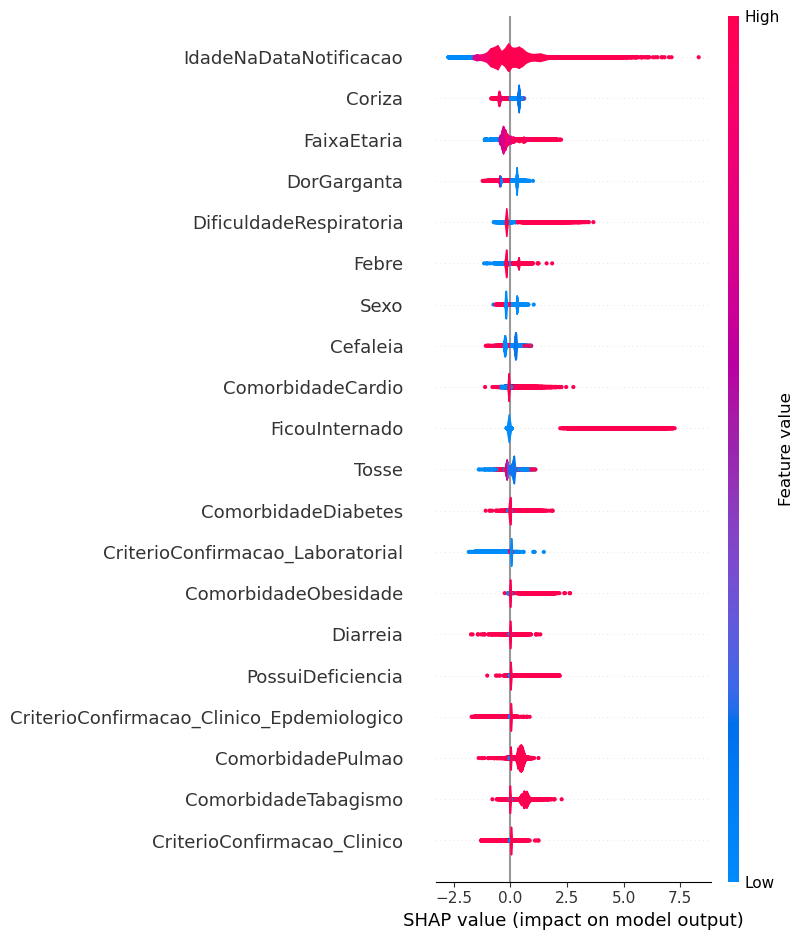

In [157]:
fileprefix = f'./results/shap_consolidated'
run_consolidated_shaps(covid_df, best_clf,fileprefix=fileprefix,balanced=False)

### SHAP - Análise Local

In [158]:
def watter_fall(shap_obj, figname):
    # Unica obervacao
    print(shap_obj[0])
    shap.plots.waterfall(shap_obj[0])

    # Gera water fall plot
    plt.savefig(figname, format='pdf', dpi=600, bbox_inches='tight')
    plt.show()

def generate_single_observation_watter_fall(df, best_clf, test_size=0.2, filesuffix="shap_single_observation", balanced=True):    
    # Reinicia modelo
    clf_model = best_clf.init_model()
    
    y = df.PASSED
    X = df.drop(columns=["PASSED"], axis=1)
    
    # Balanceia os dados
    if balanced:
        rus = RandomUnderSampler(sampling_strategy='majority')
        X, y = rus.fit_resample(X, y)
    
    # Split dos dados
    X_train, X_test,\
    y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y)

    # Calcula acurácia
    accuracy = run_model(clf_model, X, y, test_size)

    # Análise SHAP
    shap_values, shap_obj = shap_analysis(clf_model, X)

    figname = f'{fileprefix}_{filesuffix}_{i}_{int(accuracy*100)}.pdf'

    watter_fall(shap_obj, figname)

Learning rate set to 0.035549
0:	learn: 0.6507553	total: 21.1ms	remaining: 21.1s
1:	learn: 0.6128444	total: 29.4ms	remaining: 14.7s
2:	learn: 0.5793753	total: 37.2ms	remaining: 12.4s
3:	learn: 0.5487083	total: 45.4ms	remaining: 11.3s
4:	learn: 0.5227116	total: 53.4ms	remaining: 10.6s
5:	learn: 0.4973144	total: 61.2ms	remaining: 10.1s
6:	learn: 0.4767799	total: 69ms	remaining: 9.79s
7:	learn: 0.4585484	total: 76.8ms	remaining: 9.52s
8:	learn: 0.4400304	total: 85.1ms	remaining: 9.37s
9:	learn: 0.4252701	total: 93.2ms	remaining: 9.22s
10:	learn: 0.4106310	total: 101ms	remaining: 9.12s
11:	learn: 0.3971958	total: 109ms	remaining: 9s
12:	learn: 0.3865331	total: 117ms	remaining: 8.89s
13:	learn: 0.3760705	total: 125ms	remaining: 8.79s
14:	learn: 0.3662480	total: 133ms	remaining: 8.7s
15:	learn: 0.3581060	total: 140ms	remaining: 8.63s
16:	learn: 0.3506826	total: 149ms	remaining: 8.59s
17:	learn: 0.3441194	total: 156ms	remaining: 8.53s
18:	learn: 0.3379519	total: 165ms	remaining: 8.54s
19:	lea

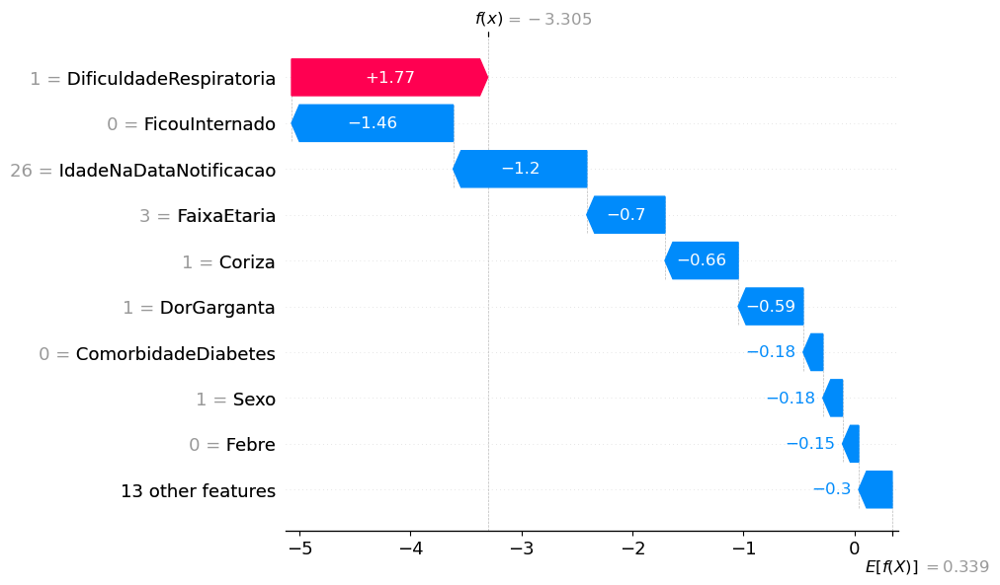

<Figure size 640x480 with 0 Axes>

In [159]:
generate_single_observation_watter_fall(covid_df, best_clf, balanced=False)